### ScRNAseq and Xenium integration and trajectory analysis (fibroblasts + adipocytes)

In [1]:
import sys 
import os
from datetime import datetime
import pandas as pd
import numpy as np
import scanpy as sc
import anndata as ad
import scvi
import hdf5plugin
import matplotlib.pyplot as plt
import seaborn as sns

# Add repo path to sys path (allows to access scripts and metadata from repo)
# repo_path = os.path.split(os.getcwd())[0]
repo_path = '/nfs/team205/vk8/projects/thymus_ageing_atlas/Spatial_analyses'
sys.path.insert(1, repo_path) 
sys.path.insert(2, '/nfs/team205/vk8/projects/thymus_ageing_atlas/General_analysis/scripts')


/nfs/team205/vk8/mambaforge/envs/scvi-env3/lib/python3.12/site-packages/docrep/decorators.py:43: SyntaxWarning: 'param_categorical_covariate_keys' is not a valid key!
  doc = func(self, args[0].__doc__, *args[1:], **kwargs)
/nfs/team205/vk8/mambaforge/envs/scvi-env3/lib/python3.12/site-packages/docrep/decorators.py:43: SyntaxWarning: 'param_continuous_covariate_keys' is not a valid key!
  doc = func(self, args[0].__doc__, *args[1:], **kwargs)


In [2]:
from datetime import datetime
today = datetime.now().strftime("%Y-%m-%d")

In [3]:
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all" # to show output from all the lines in a cells
pd.set_option('display.max_column',None) # display all the columns in pandas
pd.options.display.max_rows = 100
import matplotlib
from matplotlib import rcParams
rcParams['pdf.fonttype'] = 42
sc.settings.set_figure_params(dpi = 150, color_map = 'RdPu', dpi_save = 150, vector_friendly = True, format = 'pdf')

In [4]:
import matplotlib.pyplot as plt
from matplotlib import font_manager
font_manager.fontManager.addfont("/nfs/team205/ny1/ThymusSpatialAtlas/software/Arial.ttf")
plt.style.use(f'/nfs/team205/vk8/projects/thymus_ageing_atlas/General_analysis/scripts/plotting/thyAgeing.mplstyle')

In [5]:
# Define plot and path dirs
plot_path = os.path.join(repo_path, 'plots')
data_path = os.path.join(repo_path, 'data')
model_path = os.path.join(repo_path, 'models')
general_data_path = '/nfs/team205/vk8/projects/thymus_ageing_atlas/General_analysis/data'

In [6]:
sys.path.append('/nfs/team205/vk8/projects/thymus_ageing_atlas/General_analysis/scripts')

In [7]:
from utils import get_latest_version,update_obs,freq_by_donor
from anno_levels import get_ct_levels, get_ct_palette, age_group_levels, age_group_palette

## Load data integrated scell-xenium Fb-adipo object

In [8]:
scell2xen_fb = ad.read_h5ad(f'{data_path}/xenium/scell2xenium/adata_scell2xenium_Fibro_2025-07-09.zarr')

In [9]:
levs = ['taa_l1', 'taa_l2', 'taa_l3', 'taa_l4', 'taa_l5']
ctype = 'Fb'

In [10]:
fb_dict = {lev: get_ct_levels(level = lev, taa_l1 = [ctype]) for lev in levs }

Latest file: thyAgeing_full_curatedAnno_v9_2025-03-03_levels.xlsx
Latest file: thyAgeing_full_curatedAnno_v9_2025-03-03_levels.xlsx
Latest file: thyAgeing_full_curatedAnno_v9_2025-03-03_levels.xlsx
Latest file: thyAgeing_full_curatedAnno_v9_2025-03-03_levels.xlsx
Latest file: thyAgeing_full_curatedAnno_v9_2025-03-03_levels.xlsx


In [11]:
masks_scell = np.logical_and.reduce([scell2xen_fb.obs[lev].isin(fb_dict[lev]) for lev in fb_dict.keys()])
masks_xenium = np.logical_and.reduce([scell2xen_fb.obs[f'knn_pred-{lev}'].isin(fb_dict[lev]) for lev in fb_dict.keys()])
scell2xen_fbs_filt = scell2xen_fb[masks_scell | masks_xenium,].copy()

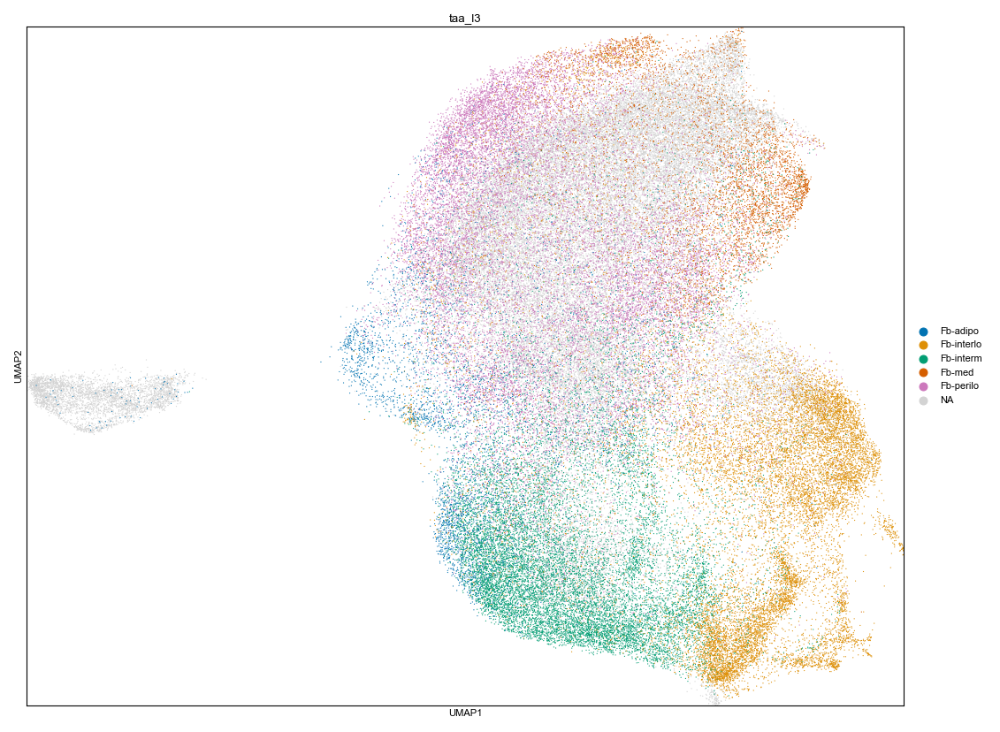

AnnData object with n_obs × n_vars = 103076 × 4993
    obs: 'sample', 'library', 'donor', 'chemistry_simple', 'age', 'sex', 'age_months', 'n_counts', 'batch', '_scvi_batch', '_scvi_labels', 'knn_pred-taa_l5', 'knn_pred-taa_l4', 'knn_pred-taa_l3', 'knn_pred-taa_l2', 'knn_pred-taa_l1', 'knn_pred-taa_l0', 'knn_uncert-taa_l5', 'knn_uncert-taa_l4', 'knn_uncert-taa_l3', 'knn_uncert-taa_l2', 'knn_uncert-taa_l1', 'knn_uncert-taa_l0', 'taa_l5', 'anno_status', 'qc_status', 'taa_l4', 'taa_l3', 'taa_l2', 'taa_l1', 'taa_l0', 'Int-leiden_r0.2', 'Int-leiden_r0.4', 'Int-leiden_r0.6', 'Int-leiden_r0.8', 'Int-leiden_r1', 'Int_anno'
    var: 'gene_name', 'gene_ids'
    uns: 'Int-leiden_r0.2', 'Int-leiden_r0.2_colors', 'Int-leiden_r0.4', 'Int-leiden_r0.4_colors', 'Int-leiden_r0.6', 'Int-leiden_r0.6_colors', 'Int-leiden_r0.8', 'Int-leiden_r0.8_colors', 'Int-leiden_r1', 'Int-leiden_r1_colors', '_scvi_manager_uuid', '_scvi_uuid', 'batch_colors', 'neighbors', 'sample_colors', 'umap', 'taa_l3_colors'
    obsm:

In [12]:
from utils_vk8 import run_leiden, regen_embed
regen_embed(scell2xen_fbs_filt, 'taa_l3')

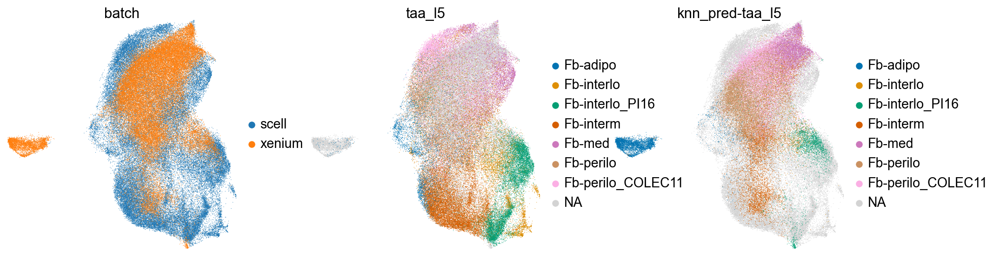

In [87]:
sc.pl.umap(scell2xen_fbs_filt, color = ['batch', 'taa_l5','knn_pred-taa_l5'], frameon = False)

In [16]:
scell2xen_fbs_filt.obs['Fb_int_anno'] = scell2xen_fbs_filt.obs.apply(lambda x: x['taa_l5'] if x['batch'] == 'scell' else 
                                                                               'Adipocyte' if x['knn_pred-taa_l5'] == 'Fb-adipo' else
                                                                               x['knn_pred-taa_l5'], axis = 1)

In [17]:
scell2xen_fbs_filt.obs['Fb_int_anno_gr'] = scell2xen_fbs_filt.obs.apply(lambda x: x['taa_l5']+'-scell' if x['batch'] == 'scell' else 
                                                                               'Adipocyte-xen' if x['knn_pred-taa_l5'] == 'Fb-adipo' else
                                                                               x['knn_pred-taa_l5']+'-xen', axis = 1)

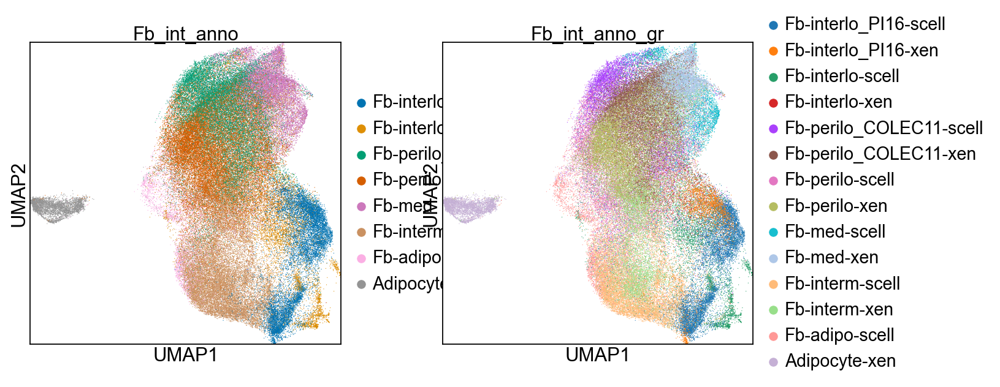

In [88]:
sc.pl.umap(scell2xen_fbs_filt, color = ['Fb_int_anno', 'Fb_int_anno_gr'])

In [20]:
fb_categories = ['Fb-interlo_PI16', 'Fb-interlo', 'Fb-perilo_COLEC11','Fb-perilo', 'Fb-med','Fb-interm','Fb-adipo','Adipocyte']
fb_categories_gran = [f"{i}-{suffix}" for i in fb_categories for suffix in ['scell', 'xen']]
fb_categories_gran.remove('Fb-adipo-xen')
fb_categories_gran.remove('Adipocyte-scell')

scell2xen_fbs_filt.obs['Fb_int_anno'] = scell2xen_fbs_filt.obs['Fb_int_anno'].cat.reorder_categories(fb_categories).copy()
scell2xen_fbs_filt.obs['Fb_int_anno_gr'] = scell2xen_fbs_filt.obs['Fb_int_anno_gr'].cat.reorder_categories(fb_categories_gran).copy()

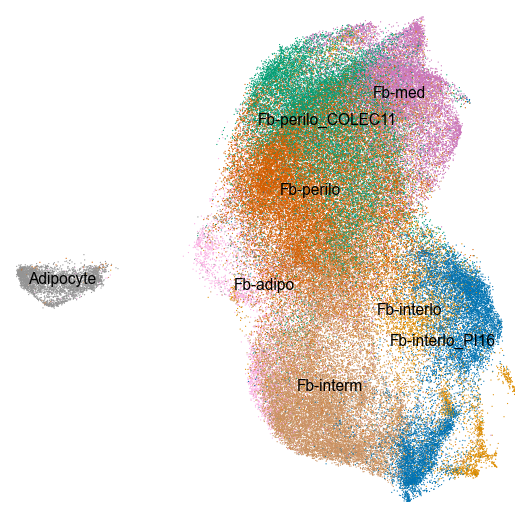

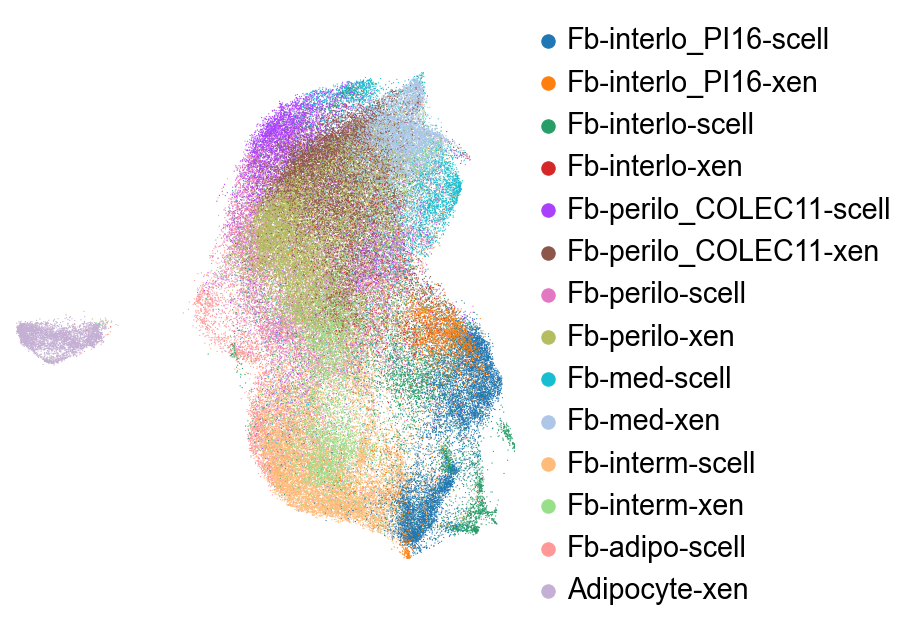

In [89]:
sc.pl.umap(scell2xen_fbs_filt, color = ['Fb_int_anno'], frameon = False, return_fig = True, legend_loc = 'on data', legend_fontsize = 7, title = '').savefig(f'{plot_path}/Scell2Xenium_Fb_Adipo_anno_UMAP_{today}.pdf')
sc.pl.umap(scell2xen_fbs_filt, color = ['Fb_int_anno_gr'], frameon = False, return_fig = True, title = '').savefig(f'{plot_path}/Scell2Xenium_Fb_Adipo_anno_gr_UMAP_{today}.pdf')

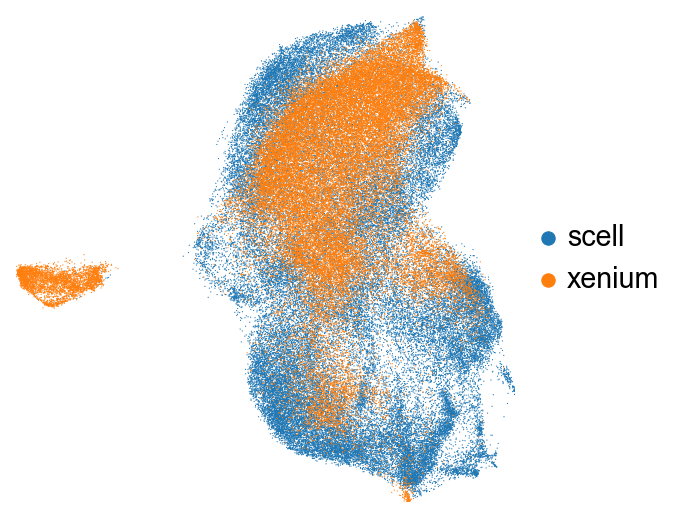

In [90]:
sc.pl.umap(scell2xen_fbs_filt, color = ['batch'], frameon = False, return_fig = True, title = '').savefig(f'{plot_path}/Scell2Xenium_Fb_Adipo_batch_UMAP_{today}.pdf')

## Plot adipose markers

In [114]:
scell2xen_fbs_filt.X = scell2xen_fbs_filt.layers['counts'].copy()

In [25]:
scell2xen_fbs_filt.X.data

array([3., 3., 4., ..., 1., 1., 1.], shape=(39447567,))

In [26]:
sc.pp.normalize_total(scell2xen_fbs_filt, target_sum = 1e4)
sc.pp.log1p(scell2xen_fbs_filt)

In [ ]:

adipose_dif_genes = {'progenitors': ['PDGFRA', 'PDGFRB', 'CD34','CD55', 'PI16', 'DPP4', 'FN1', 'IL33', ], 
                     'preadipo': ['PPARG', 'LPL', 'CD36', 'FABP4'],
                     'mature\nadipo': ['ADIPOQ', 'PLIN1', 'PLIN4', 'AQP7']}
adipose_markers = { 'progenitors': ['PDGFRA', 'PDGFRB', 'CD34','CD55', 'PI16', 'DPP4', 'FN1', 'IL33'], 
    'lipid synthesis': ['FASN', 'ACLY', 'ACACA', 'DGAT1', 'DGAT2', 'GPAM'],
                   'fa transport': ['FABP4', 'FABP5', 'MEOX2', 'TCF15', 'CD36'],
                    'lipases': ['LPL', 'LIPE'],
                    'tfs': ['CEBPA', 'PPARG'],
                    'storage genes': ['PLIN1', 'PLIN4'], 
                    'hormones': ['LEP', 'ADIPOQ']}

adipose_dif_genes_xen = {key:[i for i in adipose_dif_genes[key] if i in scell2xen_fbs_filt.var_names] for key in adipose_dif_genes.keys()}
adipose_markers_xen = {key:[i for i in adipose_markers[key] if i in scell2xen_fbs_filt.var_names] for key in adipose_markers.keys()}

In [58]:
adipose_mrkrs_lst = list()
#[adipose_mrkrs_lst.extend(v) for k,v in adipose_dif_genes_xen.items() if len(v) > 0]
[adipose_mrkrs_lst.extend(v) for k,v in adipose_markers_xen.items() if len(v) > 0]
from collections import OrderedDict
adipose_mrkrs_lst = list(OrderedDict.fromkeys(adipose_mrkrs_lst))

[None, None, None, None, None, None, None]

In [54]:
adipose_mrkrs_lst

['PDGFRA',
 'PDGFRB',
 'CD34',
 'CD55',
 'PI16',
 'DPP4',
 'IL33',
 'PPARG',
 'LPL',
 'CD36',
 'ADIPOQ',
 'PLIN1',
 'PLIN4',
 'AQP7',
 'FASN',
 'ACLY',
 'ACACA',
 'DGAT1',
 'LIPE',
 'CEBPA',
 'LEP']

In [52]:
adipose_mrkrs_lst2 = ['CD34','CD55', 'PI16', 'DPP4', 'PDGFRA', 'PDGFRB',
                     'CEBPA', 'PPARG', 'CD36', 'LPL', 'LIPE', 'LEP', 'ADIPOQ','PLIN1','PLIN4', 'AQP7', 'FASN','DGAT1']

In [34]:
from plotting.utils import plot_grouped_boxplot,thyAgeing_colors, calc_figsize

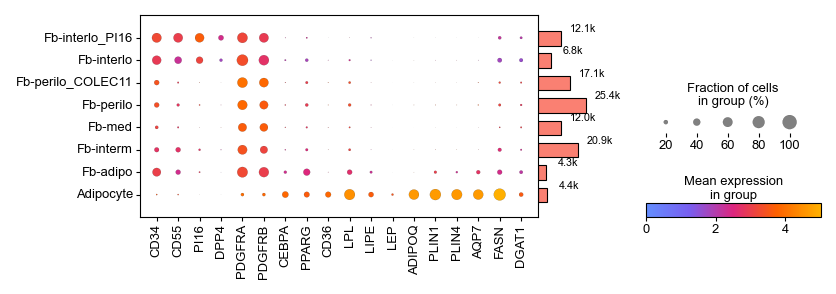

In [42]:
sc.pl.dotplot(scell2xen_fbs_filt, 
            groupby = 'Fb_int_anno',
            var_names=adipose_mrkrs_lst2,
            figsize = calc_figsize(width = 140, height = 40),
            mean_only_expressed=True, dot_max = 1, 
            cmap = sns.blend_palette([thyAgeing_colors['blue'], thyAgeing_colors['purple'], thyAgeing_colors['magenta'], thyAgeing_colors['orange'], thyAgeing_colors['yellow']], as_cmap=True,), 
            return_fig = True).style(smallest_dot=0, largest_dot = 40, dot_edge_lw=0.05).add_totals(size = 0.5).savefig(f'{plot_path}/thyAgeing_xenium2scell_FbAdipo_Markers_dotplot.pdf') 

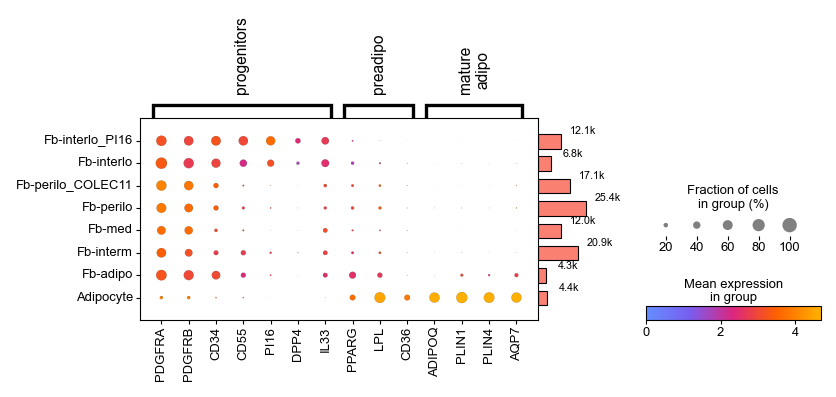

In [49]:
sc.pl.dotplot(scell2xen_fbs_filt, 
            groupby = 'Fb_int_anno',
            var_names=adipose_dif_genes_xen,
            figsize = calc_figsize(width = 140, height = 40),
            mean_only_expressed=True, dot_max = 1, vmin = 0,
            cmap = sns.blend_palette([thyAgeing_colors['blue'], thyAgeing_colors['purple'], thyAgeing_colors['magenta'], thyAgeing_colors['orange'], thyAgeing_colors['yellow']], as_cmap=True,), 
            return_fig = True).style(smallest_dot=0, largest_dot = 40, dot_edge_lw=0.05).add_totals(size = 0.5).savefig(f'{plot_path}/thyAgeing_xenium2scell_FbAdipo_Markers_dotplot.pdf') 

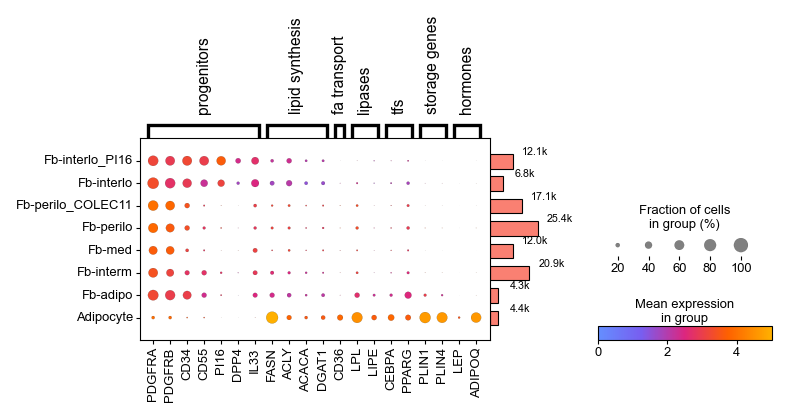

In [67]:
sc.pl.dotplot(scell2xen_fbs_filt, 
            groupby = 'Fb_int_anno',
            var_names=adipose_markers_xen,
            figsize = calc_figsize(width = 130, height = 40),
            mean_only_expressed=True, dot_max = 1, vmin = 0,
            cmap = sns.blend_palette([thyAgeing_colors['blue'], thyAgeing_colors['purple'], thyAgeing_colors['magenta'], thyAgeing_colors['orange'], thyAgeing_colors['yellow']], as_cmap=True,), 
            return_fig = True).style(smallest_dot=0, largest_dot = 40, dot_edge_lw=0.05).add_totals(size = 0.5).savefig(f'{plot_path}/thyAgeing_xenium2scell_FbAdipo_Markers_dotplot2.pdf') 

In [43]:
sc.tl.dendrogram(scell2xen_fbs_filt, groupby = 'Fb_int_anno', use_rep = 'X_scVI')

In [44]:
sc.tl.dendrogram(scell2xen_fbs_filt, groupby = 'Fb_int_anno_gr', use_rep = 'X_scVI')

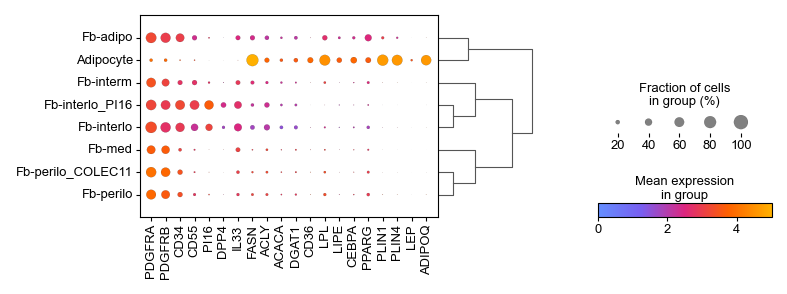

In [61]:
sc.pl.dotplot(scell2xen_fbs_filt, 
            groupby = 'Fb_int_anno',
            var_names=adipose_mrkrs_lst,
            figsize = calc_figsize(width = 130, height = 40),
            mean_only_expressed=True, dot_max = 1, dendrogram = True,
            cmap = sns.blend_palette([thyAgeing_colors['blue'], thyAgeing_colors['purple'], thyAgeing_colors['magenta'], thyAgeing_colors['orange'], thyAgeing_colors['yellow']], as_cmap=True,), 
            return_fig = True).style(smallest_dot=0, largest_dot = 40, dot_edge_lw=0.05).savefig(f'{plot_path}/thyAgeing_xenium2scell_FbAdipo_coarse_dendrogram_dotplot.pdf') 

categories: Fb-interlo_PI16, Fb-interlo, Fb-perilo_COLEC11, etc.
var_group_labels: progenitors, lipid synthesis, fa transport, etc.


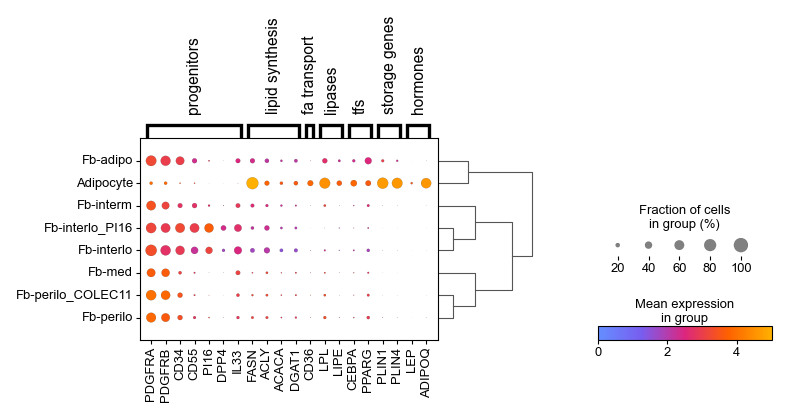

In [65]:
sc.pl.dotplot(scell2xen_fbs_filt, 
            groupby = 'Fb_int_anno',
            var_names=adipose_markers_xen,
            figsize = calc_figsize(width = 130, height = 40),
            mean_only_expressed=True, dot_max = 1, vmin= 0,  dendrogram = True,
            cmap = sns.blend_palette([thyAgeing_colors['blue'], thyAgeing_colors['purple'], thyAgeing_colors['magenta'], thyAgeing_colors['orange'], thyAgeing_colors['yellow']], as_cmap=True,), 
            return_fig = True).style(smallest_dot=0, largest_dot = 40, dot_edge_lw=0.05).savefig(f'{plot_path}/thyAgeing_xenium2scell_coarse_FbAdipo_Markers_dendrogram_dotplot.pdf') 

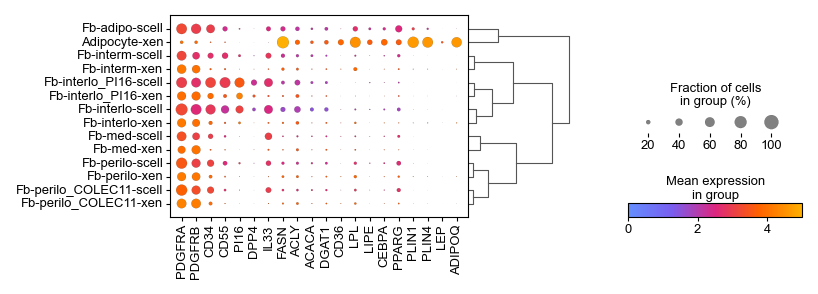

In [62]:
sc.pl.dotplot(scell2xen_fbs_filt, 
            groupby = 'Fb_int_anno_gr',
            var_names=adipose_mrkrs_lst,
            figsize = calc_figsize(width = 130, height = 40),
            mean_only_expressed=True, dot_max = 1, dendrogram = True,
            cmap = sns.blend_palette([thyAgeing_colors['blue'], thyAgeing_colors['purple'], thyAgeing_colors['magenta'], thyAgeing_colors['orange'], thyAgeing_colors['yellow']], as_cmap=True,), 
            return_fig = True).style(smallest_dot=0, largest_dot = 40, dot_edge_lw=0.05).savefig(f'{plot_path}/thyAgeing_xenium2scell_FbAdipo_granular_dendrogram_dotplot.pdf') 

categories: Fb-interlo_PI16-scell, Fb-interlo_PI16-xen, Fb-interlo-scell, etc.
var_group_labels: progenitors, lipid synthesis, fa transport, etc.


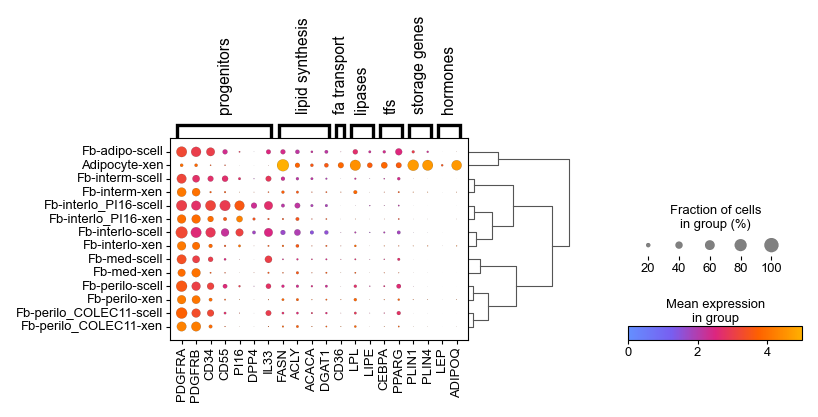

In [66]:
sc.pl.dotplot(scell2xen_fbs_filt, 
            groupby = 'Fb_int_anno_gr',
            var_names=adipose_markers_xen,
            figsize = calc_figsize(width = 130, height = 40),
            mean_only_expressed=True, dot_max = 1, vmin = 0, dendrogram = True,
            cmap = sns.blend_palette([thyAgeing_colors['blue'], thyAgeing_colors['purple'], thyAgeing_colors['magenta'], thyAgeing_colors['orange'], thyAgeing_colors['yellow']], as_cmap=True,), 
            return_fig = True).style(smallest_dot=0, largest_dot = 40, dot_edge_lw=0.05).savefig(f'{plot_path}/thyAgeing_xenium2scell_FbAdipo_granular_dendrogram2_dotplot.pdf') 

### Trajectory analysis 

In [74]:
sc.settings.set_figure_params(dpi = 80, color_map = 'RdPu', dpi_save = 300, vector_friendly = True, format = 'pdf')

In [68]:
sc.tl.paga(scell2xen_fbs_filt,  groups = "Fb_int_anno")

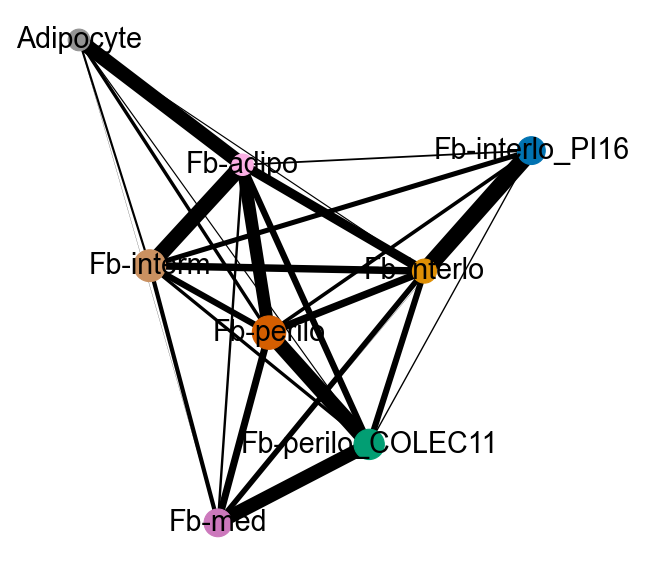

In [80]:
paga_plot = sc.pl.paga(scell2xen_fbs_filt,  color = "Fb_int_anno", frameon = False, show = False) 
plt.savefig(f'{plot_path}/thyAgeing_xenium2scell_FbAdipo_paga_graph.pdf') 

In [81]:
sc.tl.draw_graph(scell2xen_fbs_filt,  layout = 'fa', init_pos = 'paga', n_jobs = 5)


<Axes: title={'center': 'Fb_int_anno'}, xlabel='FA1', ylabel='FA2'>

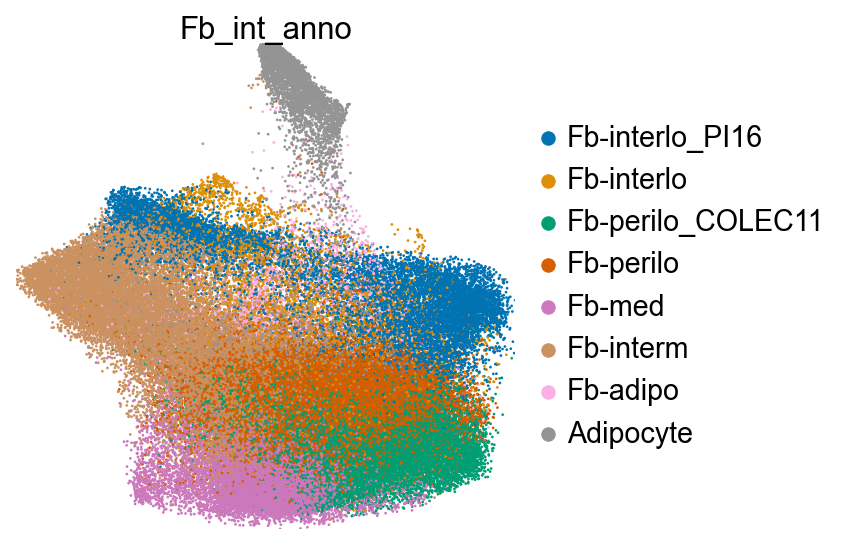

In [94]:
sc.pl.draw_graph(scell2xen_fbs_filt, color="Fb_int_anno", size = 6, frameon=False, show = False)
plt.savefig(f'{plot_path}/thyAgeing_xenium2scell_FbAdipo_graph_coarse.pdf') 

<Axes: title={'center': 'Fb_int_anno'}, xlabel='FA1', ylabel='FA2'>

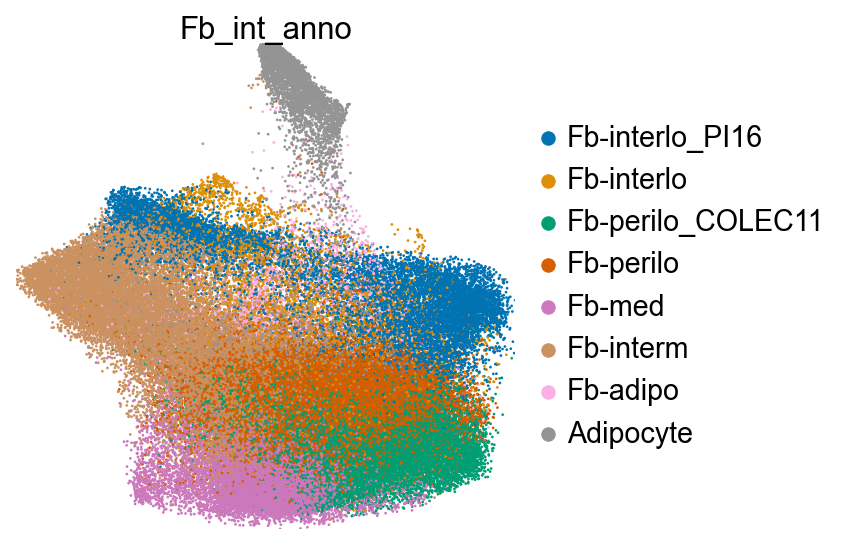

In [96]:
sc.pl.draw_graph(scell2xen_fbs_filt, color="Fb_int_anno", size = 6, frameon=False, show = False)
plt.savefig(f'{plot_path}/thyAgeing_xenium2scell_FbAdipo_graph_coarse.png') 

<Axes: title={'center': 'batch'}, xlabel='FA1', ylabel='FA2'>

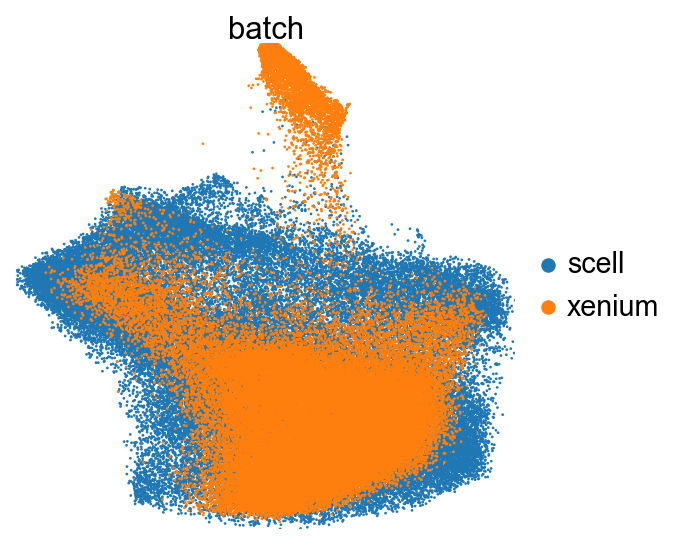

In [95]:
sc.pl.draw_graph(scell2xen_fbs_filt, color="batch", size = 6, frameon=False, show = False)
plt.savefig(f'{plot_path}/thyAgeing_xenium2scell_FbAdipo_graph_batch.pdf') 

<Axes: title={'center': 'batch'}, xlabel='FA1', ylabel='FA2'>

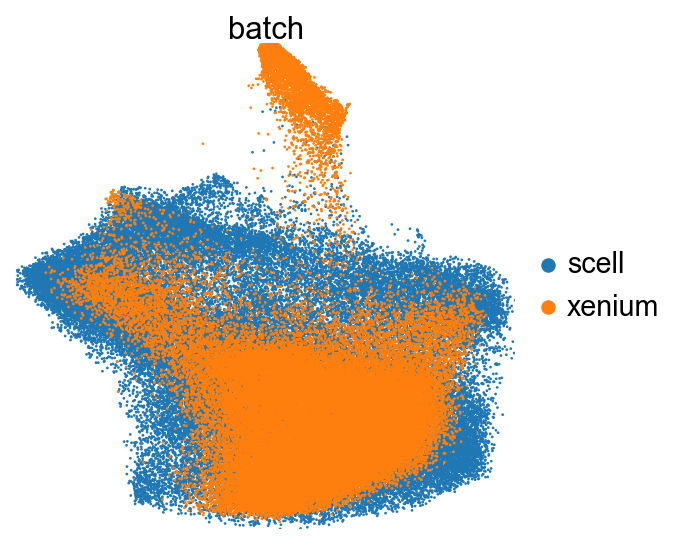

In [97]:
sc.pl.draw_graph(scell2xen_fbs_filt, color="batch", size = 6, frameon=False, show = False)
plt.savefig(f'{plot_path}/thyAgeing_xenium2scell_FbAdipo_graph_batch.png') 

In [91]:
today

'2025-07-28'

In [92]:
scell2xen_fbs_filt.write_h5ad(f'{data_path}/xenium/scell2xenium/adata_scell2xenium_FbAdipo_filt_{today}.zarr', 
                       compression=hdf5plugin.FILTERS["zstd"],
        compression_opts=hdf5plugin.Zstd(clevel=5).filter_options)

In [93]:
scell2xen_fbs_filt

AnnData object with n_obs × n_vars = 103076 × 4993
    obs: 'sample', 'library', 'donor', 'chemistry_simple', 'age', 'sex', 'age_months', 'n_counts', 'batch', '_scvi_batch', '_scvi_labels', 'knn_pred-taa_l5', 'knn_pred-taa_l4', 'knn_pred-taa_l3', 'knn_pred-taa_l2', 'knn_pred-taa_l1', 'knn_pred-taa_l0', 'knn_uncert-taa_l5', 'knn_uncert-taa_l4', 'knn_uncert-taa_l3', 'knn_uncert-taa_l2', 'knn_uncert-taa_l1', 'knn_uncert-taa_l0', 'taa_l5', 'anno_status', 'qc_status', 'taa_l4', 'taa_l3', 'taa_l2', 'taa_l1', 'taa_l0', 'Int-leiden_r0.2', 'Int-leiden_r0.4', 'Int-leiden_r0.6', 'Int-leiden_r0.8', 'Int-leiden_r1', 'Int_anno', 'Fb_int_anno', 'Fb_int_anno_gr'
    var: 'gene_name', 'gene_ids'
    uns: 'Int-leiden_r0.2', 'Int-leiden_r0.2_colors', 'Int-leiden_r0.4', 'Int-leiden_r0.4_colors', 'Int-leiden_r0.6', 'Int-leiden_r0.6_colors', 'Int-leiden_r0.8', 'Int-leiden_r0.8_colors', 'Int-leiden_r1', 'Int-leiden_r1_colors', '_scvi_manager_uuid', '_scvi_uuid', 'batch_colors', 'neighbors', 'sample_colors', 

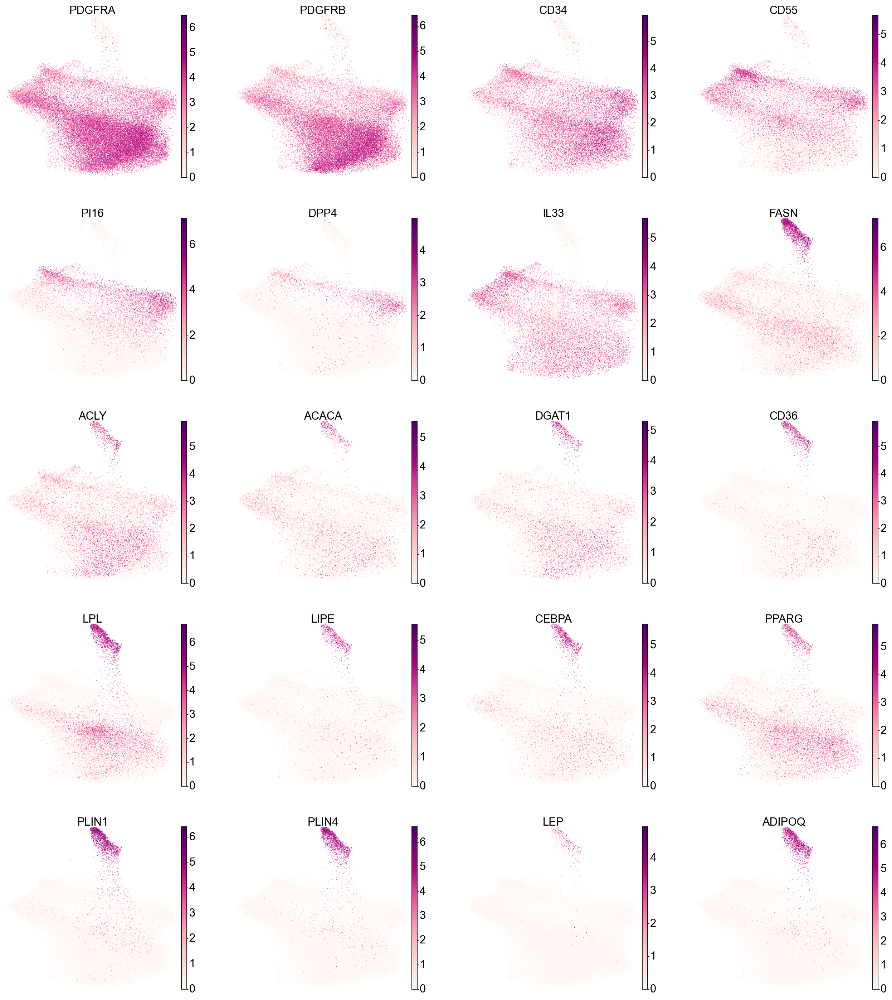

In [86]:
sc.pl.draw_graph(scell2xen_fbs_filt, color= adipose_mrkrs_lst, ncols = 4, frameon=False)